<a href="https://colab.research.google.com/github/Leonela180/redes_neuronales/blob/main/Gatos_Perros.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Redes Neuronales

In [5]:
import tensorflow as tf
import tensorflow_datasets as tfds
#--------------------------------
import matplotlib.pyplot as plt
import cv2
#-------------------------------
import numpy as np

In [6]:
#set de datos de gatos y perros
datos, metadatos = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/incomplete.JO9R9G_4.0.1/cats_vs_dogs-train.tfrecord*...:   0%…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


In [7]:
metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.1',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir='/root/tensorflow_datasets/cats_vs_dogs/4.0.1',
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=1.04 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    nondeterministic_order=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=16>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, Jo

,image,label
0,,1 (dog)
1,,1 (dog)
2,,1 (dog)

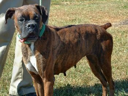
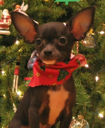
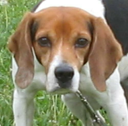

In [8]:
#Nos muestra imgenes con las que estamos trabajando
tfds.as_dataframe(datos['train'].take(3), metadatos)

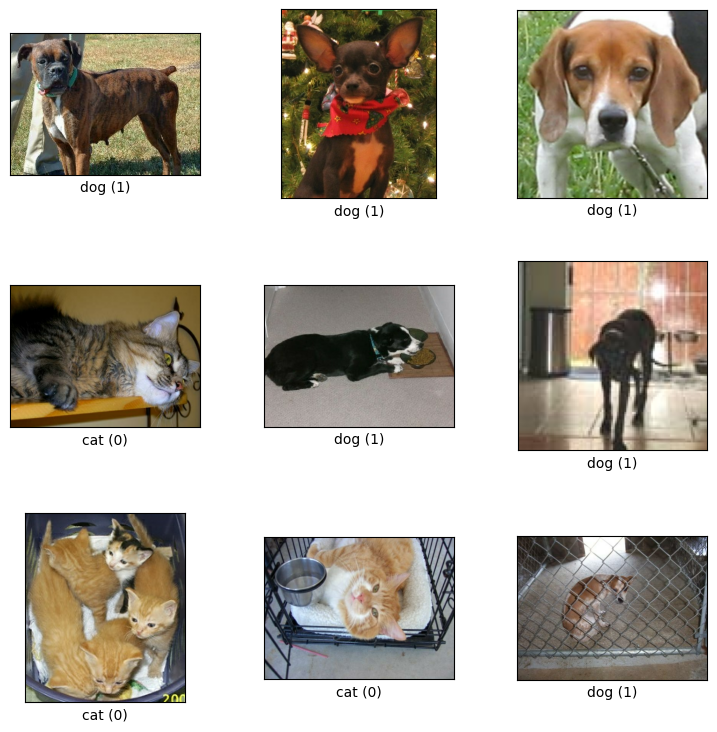

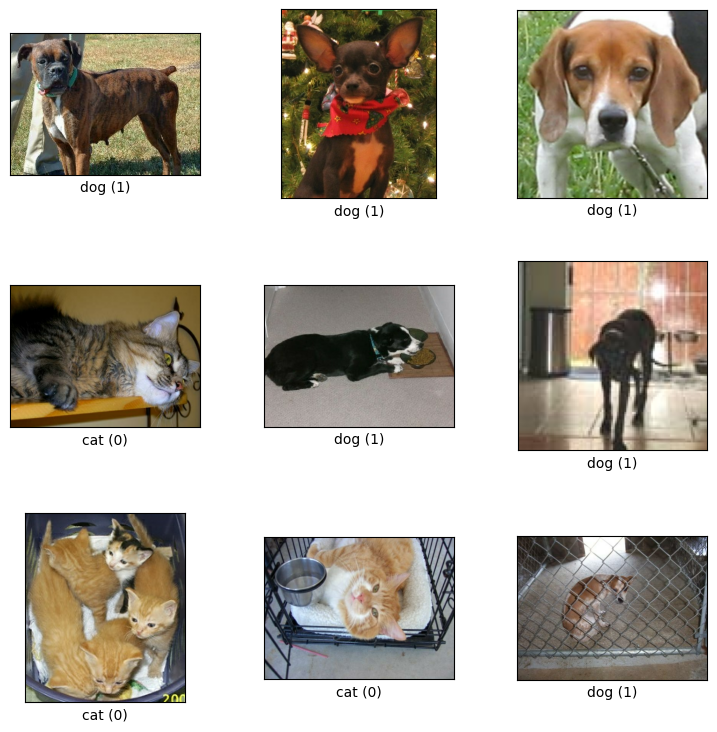

In [9]:
#otra manera
tfds.show_examples(datos['train'], metadatos)

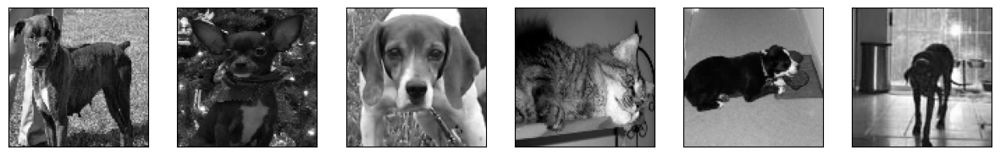

In [10]:
#manera mas sencilla
plt.figure(figsize=(15,15))

TAMANO_IMG=100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(6)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(6, 6, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen, cmap='gray')

In [11]:
#Ver los datos del primer indice
datos_entrenamiento=[]
#lista simple
for i, (imagen, etiqueta) in enumerate(datos['train']): #Todos los datos
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1) #Cambiar tamano a 100,100,1
  datos_entrenamiento.append([imagen, etiqueta])
#imprimir primer indice
datos_entrenamiento[0]#1deperros_0degatos

[array([[[249],
         [190],
         [105],
         ...,
         [189],
         [196],
         [143]],
 
        [[232],
         [127],
         [ 88],
         ...,
         [187],
         [180],
         [186]],
 
        [[171],
         [ 87],
         [ 83],
         ...,
         [129],
         [158],
         [166]],
 
        ...,
 
        [[113],
         [173],
         [162],
         ...,
         [143],
         [156],
         [119]],
 
        [[140],
         [152],
         [171],
         ...,
         [ 98],
         [155],
         [154]],
 
        [[ 91],
         [109],
         [167],
         ...,
         [ 46],
         [ 51],
         [ 47]]], dtype=uint8),
 <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [12]:
#Cuantos arrglos tengo
len(datos_entrenamiento)

23262

In [13]:
X = [] #imagenes de entrada (pixeles)
y = [] #etiquetas (perro o gato)

for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  y.append(etiqueta)

In [14]:
#pixeles
X

[array([[[249],
         [190],
         [105],
         ...,
         [189],
         [196],
         [143]],
 
        [[232],
         [127],
         [ 88],
         ...,
         [187],
         [180],
         [186]],
 
        [[171],
         [ 87],
         [ 83],
         ...,
         [129],
         [158],
         [166]],
 
        ...,
 
        [[113],
         [173],
         [162],
         ...,
         [143],
         [156],
         [119]],
 
        [[140],
         [152],
         [171],
         ...,
         [ 98],
         [155],
         [154]],
 
        [[ 91],
         [109],
         [167],
         ...,
         [ 46],
         [ 51],
         [ 47]]], dtype=uint8),
 array([[[149],
         [114],
         [ 93],
         ...,
         [103],
         [ 72],
         [ 81]],
 
        [[127],
         [ 63],
         [ 79],
         ...,
         [131],
         [ 70],
         [ 98]],
 
        [[ 82],
         [ 65],
         [ 58],
         ...,
      

In [15]:
X = np.array(X).astype(float) / 255 #arreglo de numpy a numero flotante

In [16]:
X

array([[[[0.97647059],
         [0.74509804],
         [0.41176471],
         ...,
         [0.74117647],
         [0.76862745],
         [0.56078431]],

        [[0.90980392],
         [0.49803922],
         [0.34509804],
         ...,
         [0.73333333],
         [0.70588235],
         [0.72941176]],

        [[0.67058824],
         [0.34117647],
         [0.3254902 ],
         ...,
         [0.50588235],
         [0.61960784],
         [0.65098039]],

        ...,

        [[0.44313725],
         [0.67843137],
         [0.63529412],
         ...,
         [0.56078431],
         [0.61176471],
         [0.46666667]],

        [[0.54901961],
         [0.59607843],
         [0.67058824],
         ...,
         [0.38431373],
         [0.60784314],
         [0.60392157]],

        [[0.35686275],
         [0.42745098],
         [0.65490196],
         ...,
         [0.18039216],
         [0.2       ],
         [0.18431373]]],


       [[[0.58431373],
         [0.44705882],
         [0.36

In [47]:
y

array([1, 1, 1, ..., 0, 1, 0])

In [17]:
#Convertir etiquetas en arreglo simple
y = np.array(y)

In [18]:
X.shape #entadas. cxc 1 canal de color

(23262, 100, 100, 1)

In [21]:
#arquitectua, iper parametros
#denso
modeloDenso = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])
#convolucional
modeloCNN = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2 = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])
#Compilar modelos. Usar crossentropy binario ya que tenemos solo 2 opciones (perro o gato)
modeloDenso.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])


In [22]:
from tensorflow.keras.callbacks import TensorBoard

In [23]:
#variable para el entrenamiento
tensorboardDenso = TensorBoard(log_dir='logs/denso')
#entrenar
modeloDenso.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardDenso])

Epoch 1/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - accuracy: 0.5344 - loss: 0.7731 - val_accuracy: 0.5415 - val_loss: 0.6796
Epoch 2/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.5800 - loss: 0.6734 - val_accuracy: 0.5943 - val_loss: 0.6638
Epoch 3/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6002 - loss: 0.6649 - val_accuracy: 0.5871 - val_loss: 0.6704
Epoch 4/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5890 - loss: 0.6673 - val_accuracy: 0.5716 - val_loss: 0.6762
Epoch 5/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6008 - loss: 0.6631 - val_accuracy: 0.5937 - val_loss: 0.6677
Epoch 6/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6029 - loss: 0.6620 - val_accuracy: 0.5926 - val_loss: 0.6637
Epoch 7/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.5899 - loss: 0.6645 - val_accuracy: 0.5903 - val_loss: 0.6681
Epoch 8/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6006 - loss: 0.6640 - val_accu

In [25]:
#Cargar la extension de tensorboard de colab
%load_ext tensorboard
#Ejecutar tensorboard e indicarle que lea la carpeta "logs"
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [26]:
tensorboardCNN = TensorBoard(log_dir='logs/cnn')
modeloCNN.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN])

Epoch 1/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 16s 17ms/step - accuracy: 0.5637 - loss: 0.6720 - val_accuracy: 0.7241 - val_loss: 0.5374
Epoch 2/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.7644 - loss: 0.4879 - val_accuracy: 0.7908 - val_loss: 0.4505
Epoch 3/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.8122 - loss: 0.4073 - val_accuracy: 0.7860 - val_loss: 0.4559
Epoch 4/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.8417 - loss: 0.3497 - val_accuracy: 0.8266 - val_loss: 0.3873
Epoch 5/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.8862 - loss: 0.2763 - val_accuracy: 0.8252 - val_loss: 0.4043
Epoch 6/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 12ms/step - accuracy: 0.9122 - loss: 0.2132 - val_accuracy: 0.8284 - val_loss: 0.4416
Epoch 7/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.9374 - loss: 0.1544 - val_accuracy: 0.8324 - val_loss: 0.4518
Epoch 8/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.9616 - loss: 0.102

In [27]:
tensorboardCNN2 = TensorBoard(log_dir='logs/cnn2')
modeloCNN2.fit(X, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN2])

Epoch 1/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 15s 19ms/step - accuracy: 0.5958 - loss: 0.6570 - val_accuracy: 0.7146 - val_loss: 0.5523
Epoch 2/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.7418 - loss: 0.5170 - val_accuracy: 0.7851 - val_loss: 0.4642
Epoch 3/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.7930 - loss: 0.4470 - val_accuracy: 0.8049 - val_loss: 0.4221
Epoch 4/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.8149 - loss: 0.4000 - val_accuracy: 0.8201 - val_loss: 0.3963
Epoch 5/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 11s 13ms/step - accuracy: 0.8402 - loss: 0.3612 - val_accuracy: 0.8355 - val_loss: 0.3724
Epoch 6/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.8598 - loss: 0.3228 - val_accuracy: 0.8378 - val_loss: 0.3634
Epoch 7/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.8743 - loss: 0.2893 - val_accuracy: 0.8456 - val_loss: 0.3428
Epoch 8/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.8919 - loss: 0.25

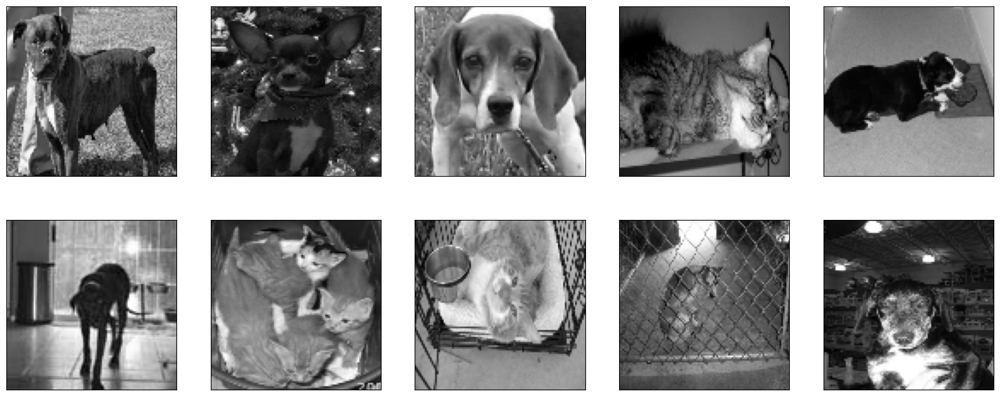

In [28]:
#ver las imagenes de la variable X sin modificaciones por aumento de datos
plt.figure(figsize=(20, 8))
for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(X[i].reshape(100, 100), cmap="gray")

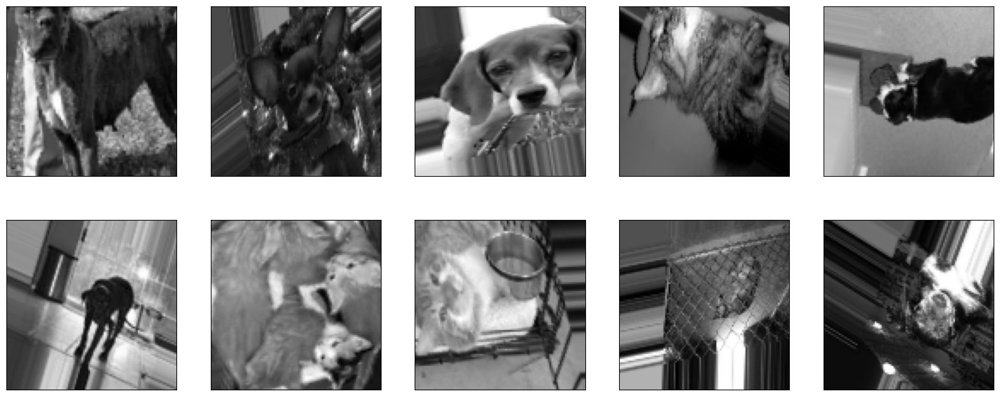

In [29]:
#Realizar el aumento de datos con varias transformaciones. Al final, graficar 10 como ejemplo
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(X)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(X, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(100, 100), cmap="gray")
  break

In [30]:
modeloDenso_AD = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [31]:
modeloDenso_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [32]:
#Separar los datos de entrenamiento y los datos de pruebas en variables diferentes

len(X) * .85 #19700
len(X) - 19700 #3562

X_entrenamiento = X[:19700]
X_validacion = X[19700:]

y_entrenamiento = y[:19700]
y_validacion = y[19700:]

In [33]:
#Separar los datos de entrenamiento y los datos de pruebas en variables diferentes

len(X) * .85 #19700
len(X) - 19700 #3562

X_entrenamiento = X[:19700]
X_validacion = X[19700:]

y_entrenamiento = y[:19700]
y_validacion = y[19700:]

In [34]:
#Usar la funcion flow del generador para crear un iterador que podamos enviar como entrenamiento a la funcion FIT del modelo
data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

In [35]:
tensorboardDenso_AD = TensorBoard(log_dir='logs/denso_AD')

modeloDenso_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardDenso_AD]
)

366/616 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - accuracy: 0.5181 - loss: 0.6874

KeyboardInterrupt: 

In [ ]:
tensorboardCNN_AD = TensorBoard(log_dir='logs-new/cnn_AD')

modeloCNN_AD.fit(
    data_gen_entrenamiento,
    epochs=150, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN_AD]
)

In [ ]:
tensorboardCNN2_AD = TensorBoard(log_dir='logs/cnn2_AD')

modeloCNN2_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN2_AD]
)

Epoch 1/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 31s 44ms/step - accuracy: 0.5224 - loss: 0.6980 - val_accuracy: 0.5564 - val_loss: 0.6831
Epoch 2/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - accuracy: 0.5632 - loss: 0.6817 - val_accuracy: 0.5741 - val_loss: 0.6836
Epoch 3/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - accuracy: 0.5700 - loss: 0.6809 - val_accuracy: 0.5823 - val_loss: 0.6726
Epoch 4/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - accuracy: 0.5701 - loss: 0.6773 - val_accuracy: 0.5912 - val_loss: 0.6723
Epoch 5/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 23s 38ms/step - accuracy: 0.5886 - loss: 0.6682 - val_accuracy: 0.6364 - val_loss: 0.6422
Epoch 6/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.6225 - loss: 0.6530 - val_accuracy: 0.6743 - val_loss: 0.6217
Epoch 7/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.6334 - loss: 0.6416 - val_accuracy: 0.6805 - val_loss: 0.6071
Epoch 8/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 41s 38ms/step - accuracy: 0.6478 - loss: 0

In [ ]:
modeloCNN_AD.save('perros-gatos-cnn-ad.h5')

In [ ]:
!pip install tensorflowjs

In [ ]:
!mkdir carpeta_salida

In [ ]:
!tensorflowjs_converter --input_format keras perros-gatos-cnn-ad.h5 carpeta_salida